<a href="https://colab.research.google.com/github/pyypyyy/aa2codon/blob/main/Codon_optimizer_train.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!git clone https://github.com/pyypyyy/aa2codon.git
!pip install --upgrade tensorflow
!pip install biopython
!pip install tensorflow-text


import time
from tqdm.notebook import tqdm as tqdm
from Bio import SeqIO
from Bio import Seq
import numpy as np
import tensorflow as tf
import os
import time
import functools
from IPython import display as ipythondisplay
from multiprocessing import Pool
import pandas as pd
import glob
import json
import matplotlib.pyplot as plt

Cloning into 'aa2codon'...
remote: Enumerating objects: 104, done.
remote: Counting objects: 100% (98/98), done.
remote: Compressing objects: 100% (86/86), done.
remote: Total 104 (delta 43), reused 31 (delta 10), pack-reused 6
Receiving objects: 100% (104/104), 62.91 MiB | 24.83 MiB/s, done.
Resolving deltas: 100% (43/43), done.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 588.3/588.3 MB 2.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.0/6.0 MB 105.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 81.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 439.2/439.2 KB 46.6 MB/s eta 0:00:00
  Attempting uninstall: flatbuffers
    Found existing installation: flatbuffers 1.12
    Uninstalling flatbuffers-1.12:
      Successfully uninstalled flatbuffers-1.12
  Attempting uninstall: tensorflow-estimator
    Found existing installation: t

In [2]:
def whitespace_separate(my_string, n):
  substrings = []
  for i in range(0, len(my_string), n):
      substring = my_string[i:i+n]
      substrings.append(substring)
  substrings = " ".join(substrings)
  return substrings

def process_cds(directory, output_file, max_seqs=7000):
    """
    takes a directory containing FASTA files with CDS sequences and identifies
    which of the sequences are pseudogenes to get rid of those. Contains a limit
    to amount of sequences to avoid overrepresentation of sequences from possible 
    higher orgtanisms if used for learning multiple genomes.
    It saves the list of CDS/protein/filename tuples as a JSON file.
    """
    

    
    # get a list of all files in the directory
    files = os.listdir(directory)
    # initialize an empty list to store the CDS/protein/filename tuples
    cds_proteins = []
    # iterate over the files
    for file in tqdm(files):
        print(f'Parsing {file.split(".")[0]}')
        # get the full path to the file
        fasta_file = os.path.join(directory, file)
        # open the FASTA file and create an iterator over the records
        records = SeqIO.parse(fasta_file, "fasta")
        # iterate over the records
        # Count rejected sequences
        counter = 0
        # Counter for limiting the amount of sequences
        counter2 = 0
        length = len(list(records))
        records = SeqIO.parse(fasta_file, "fasta")
        for rec in tqdm(records, total=length):
            if len(rec.seq) % 3 != 0:
              counter += 1
              continue
            elif "pseudogene" in rec.description:
                counter += 1
                continue
            if counter2 > max_seqs:
              continue
            else:
                # translate the CDS sequence into a protein
                protein = rec.seq.translate()
                # create a tuple with the CDS, protein, and filename
                cds_protein = (f'<{file.split(".")[0]}>', str(rec.seq), str(protein))
                # add the tuple to the list of CDS/protein/filename tuples
                cds_proteins.append(cds_protein)
                counter2 += 1
        print(f'Skipped over {counter} sequences because they were not a multiple of 3 or were pseudogenes')
        print(f'Total amount of good sequences in {file} = {counter2}')
    
    data = cds_proteins
    # encode the list of CDS/protein/filename tuples as JSON data
    df = pd.DataFrame(data, columns=['filename', 'gene_sequence', 'protein_sequence'])
    # separate codons and amino acids with whitespace
    df['gene_sequence'] = df['gene_sequence'].apply(lambda x: whitespace_separate(x, 3))
    df['protein_sequence'] = df['protein_sequence'].apply(lambda x: whitespace_separate(x, 1))
    # split the strings in the second and third columns into lists
    df['gene_sequence'] = df['gene_sequence'].str.split()
    df['protein_sequence'] = df['protein_sequence'].str.split()
    # insert filename(organism) identifier token if more than one file parsed
    if len(files) > 1:
        for i in range(len(df)):
          df['gene_sequence'][i].insert(0, df["filename"][i])
          df['protein_sequence'][i].insert(0, df["filename"][i])
    # join the lists of codons back into strings, using whitespace as the separator
    df['gene_sequence'] = df['gene_sequence'].str.join(' ')
    df['protein_sequence'] = df['protein_sequence'].str.join(' ')
    #REmove this if you have more than one organism for training
    df = df.drop('filename', axis=1)

    return df


In [3]:



def create_dataframe(file_names):
  """For processing a .fna file containing  genes and the corresponding protein sequence
  into a dataframe for later manipulation. Using an example file of E.coli for training
  There are two other files available for inserting into the genome folder"""
  # initialize an empty list to store the input/target tuples
  sequence_tuples = []

  for file_name in file_names:
    # check if the file exists
    if os.path.isfile(file_name):
      # use json to read the data from the file
      with open(file_name, 'r') as file:
        try:
          # try to parse the JSON data
          data = json.load(file)
          # add the filename to each tuple
          data = [(file_name.split("/")[-1].split("_")[0], sequence[0], sequence[1]) for sequence in data]
          # add the data from the file to the list of tuples
          sequence_tuples += data
        except json.JSONDecodeError:
          # if the data is not valid JSON, skip the file
          continue
    else:
      # if the file doesn't exist, skip it
      continue

  # create a dataframe from the list of tuples
  df = pd.DataFrame(sequence_tuples, columns=['filename', 'gene_sequence', 'protein_sequence'])
  df['protein_sequence'] = df['protein_sequence'].str.slice(start=2, stop=-2)
  df['protein_sequence'] = df['protein_sequence'].apply(lambda x: x + '*')
  # separate codons and amino acids with whitespace
  df['gene_sequence'] = df['gene_sequence'].apply(lambda x: whitespace_separate(x, 3))
  df['protein_sequence'] = df['protein_sequence'].apply(lambda x: whitespace_separate(x, 1))
  # split the strings in the second and third columns into lists of words
  df['gene_sequence'] = df['gene_sequence'].str.split()
  df['protein_sequence'] = df['protein_sequence'].str.split()
  # insert filename(organism) identifier token
  for i in range(len(df)):
    df['gene_sequence'][i].insert(0, df["filename"][i])
    df['protein_sequence'][i].insert(0, df["filename"][i])
  # join the lists of words back into strings, using whitespace as the separator
  df['gene_sequence'] = df['gene_sequence'].str.join(' ')
  df['protein_sequence'] = df['protein_sequence'].str.join(' ')

  df = df.drop('filename', axis=1)

  # check the number of rows and columns in the dataframe
  print(f"The dataframe has {df.shape[0]} rows and {df.shape[1]} columns.")

  # print the first few rows of the dataframe
  print(df.head())

  return df

def shorten(seq, max_length):
  # Splits a sequence in half if it is over the specified max_length
  seq2 = []
  for i in tqdm(seq):
    if len(i) > max_length:
      organism = i[0]
      first = i[: (len(i) // 2)]
      second = i[(len(i) // 2) :]
      second.insert(0, organism)
      seq2.append(first)
      seq2.append(second)
    else:
      seq2.append(i)
  return seq2



In [4]:

# set the path to the directory containing the folders you want to iterate over

path = "/content/aa2codon/Genomes"

df = process_cds(path, f"{path}/cds_proteins.json", max_seqs=7000)

  0%|          | 0/1 [00:00<?, ?it/s]

Parsing Ecol


  0%|          | 0/4315 [00:00<?, ?it/s]

Skipped over 0 sequences because they were not a multiple of 3 or were pseudogenes
Total amount of good sequences in Ecol.fna = 4315


In [5]:
print("Sequences: ")
print(df)

Sequences: 
                                          gene_sequence  \
0     ATG AAA CGC ATT AGC ACC ACC ATT ACC ACC ACC AT...   
1     ATG CGA GTG TTG AAG TTC GGC GGT ACA TCA GTG GC...   
2     ATG GTT AAA GTT TAT GCC CCG GCT TCC AGT GCC AA...   
3     ATG AAA CTC TAC AAT CTG AAA GAT CAC AAC GAG CA...   
4     GTG AAA AAG ATG CAA TCT ATC GTA CTC GCA CTT TC...   
...                                                 ...   
4310  ATG TTG AAA TCC CCC CTG TTC TGG AAA ATG ACT AG...   
4311  ATG CAG ACC CCG CAC ATT CTT ATC GTT GAA GAC GA...   
4312  ATG ACT AAA GTA CGT AAT TGC GTT CTT GAT GCA CT...   
4313  TTG TCG AGA TTT ATT TTT TAT AAA ATT ATC CTA AG...   
4314  ATG CGT ATA ACG ATT ATT CTG GTC GCA CCC GCC AG...   

                                       protein_sequence  
0           M K R I S T T I T T T I T I T T G N G A G *  
1     M R V L K F G G T S V A N A E R F L R V A D I ...  
2     M V K V Y A P A S S A N M S V G F D V L G A A ...  
3     M K L Y N L K D H N E Q V S F A Q A V T Q

In [6]:
max_length = 150
max_len = max_length

In [7]:

# Process the sequences to specified length
codons = []
for i in list(df["gene_sequence"]):
  codons.append(i.split(" "))
aas = []
for i in list(df["protein_sequence"]):
  aas.append(i.split(" "))
print(f'Parsing to a maximum of {max_len} codons')
while any(len(x) > max_len for x in codons):
  codons = shorten(codons, max_len)
print(f'Parsing to a maximum of {max_len} aas')
while any(len(x) > max_len for x in aas):
  aas = shorten(aas, max_len)

# Add start-end tokens:

for i in codons:
  i.append("<end>")
  i.insert(0, "<start>")

for i in aas:
  i.append("<end>")
  i.insert(0, "<start>")


codons = [" ".join(i) for i in codons]
aas = [" ".join(i) for i in aas]




Parsing to a maximum of 150 codons


  0%|          | 0/4315 [00:00<?, ?it/s]

  0%|          | 0/7665 [00:00<?, ?it/s]

  0%|          | 0/11520 [00:00<?, ?it/s]

  0%|          | 0/12915 [00:00<?, ?it/s]

Parsing to a maximum of 150 aas


  0%|          | 0/4315 [00:00<?, ?it/s]

  0%|          | 0/7665 [00:00<?, ?it/s]

  0%|          | 0/11520 [00:00<?, ?it/s]

  0%|          | 0/12915 [00:00<?, ?it/s]

# Datasets for training

https://www.tensorflow.org/datasets

In [8]:
# tf.datasets for efficiently making  training and validation datasets

def makeds(seqs):
  num_val_samples = int(0.07 * len(seqs))
  num_train_samples = len(seqs) - 2 * num_val_samples
  train_pairs = seqs[:num_train_samples]
  val_pairs = seqs[num_train_samples :]
  return (train_pairs, val_pairs)

In [9]:
train_aas, val_aas = makeds(aas)
train_codons, val_codons = makeds(codons)

In [10]:
tds = tf.data.Dataset.from_tensor_slices((train_aas, train_codons))
vds = tf.data.Dataset.from_tensor_slices((val_aas, val_codons))

In [11]:
# Using tf.keras.layers.TextVectorization for making vector representation of the amino acids and codons

aa2id = tf.keras.layers.TextVectorization(standardize = None, split = "whitespace")
aa2id.adapt(tf.constant(aas))


codon2id = tf.keras.layers.TextVectorization(standardize = None, split = "whitespace")
codon2id.adapt(tf.constant(codons))

In [12]:
codon_voc = codon2id.get_vocabulary()
aa_voc = aa2id.get_vocabulary()

In [13]:
# For converting vector back to amino acids and codons

id2codon = {str(codon_voc.index(i)) : i for i in codon_voc}
id2aa = {str(aa_voc.index(i)) : i for i in aa_voc}

def decode_codons(result):
  return [id2codon[str(key)] for key in np.array(result)]

def decode_aas(input):
    return [id2aa[str(key)] for key in np.array(input)]



In [14]:
# preparing batches for training

def prepare_batch(aas, codons):
    aas = aa2id(aas)      

    codons = codon2id(codons)
    codons_inputs = codons[:, :-1]  # Drop the [END] tokens
    codons_labels = codons[:, 1:]   # Drop the [START] tokens

    return (aas, codons_inputs), codons_labels

def make_batches(ds):
  return (
      ds
      .shuffle(BUFFER_SIZE)
      .batch(BATCH_SIZE)
      .map(prepare_batch, tf.data.AUTOTUNE)
      .prefetch(buffer_size=tf.data.AUTOTUNE))

In [15]:
BUFFER_SIZE = 100000
BATCH_SIZE = 64

train_batches = make_batches(tds)
val_batches = make_batches(vds)
for (aas, codons), codons_labels in train_batches.take(1):
  break

print(aas.shape)
print(codons.shape)
print(codons_labels.shape)

(64, 152)
(64, 151)
(64, 151)


In [16]:
# For defining the neural network input - output tensors

aa_vocab_size = len(aa2id.get_vocabulary())
codon_vocab_size = len(codon2id.get_vocabulary())

# Model


Mostly prebuilti n the tutorial.

https://www.tensorflow.org/text/tutorials/transformer

Some modifications for embedding and output shapes.




In [17]:
def positional_encoding(length, depth):
  depth = depth/2

  positions = np.arange(length)[:, np.newaxis]     # (seq, 1)
  depths = np.arange(depth)[np.newaxis, :]/depth   # (1, depth)

  angle_rates = 1 / (10000**depths)         # (1, depth)
  angle_rads = positions * angle_rates      # (pos, depth)

  pos_encoding = np.concatenate(
      [np.sin(angle_rads), np.cos(angle_rads)],
      axis=-1) 

  return tf.cast(pos_encoding, dtype=tf.float32)

In [18]:
class PositionalEmbedding(tf.keras.layers.Layer):
  def __init__(self, vocab_size, d_model):
    super().__init__()
    self.d_model = d_model
    self.embedding = tf.keras.layers.Embedding(vocab_size, d_model, mask_zero=True) 
    self.pos_encoding = positional_encoding(length=2048, depth=d_model)

  def compute_mask(self, *args, **kwargs):
    return self.embedding.compute_mask(*args, **kwargs)
  
  def call(self, x):
    length = tf.shape(x)[1]
    x = self.embedding(x)
    # This factor sets the relative scale of the embedding and positonal_encoding.
    x *= tf.math.sqrt(tf.cast(self.d_model, tf.float32))
    x = x + self.pos_encoding[tf.newaxis, :length, :]
    return x

In [19]:
embed_aa = PositionalEmbedding(vocab_size=aa_vocab_size, d_model=512)
embed_codon = PositionalEmbedding(vocab_size=codon_vocab_size, d_model=512)

In [20]:
class BaseAttention(tf.keras.layers.Layer):
  def __init__(self, **kwargs):
    super().__init__()
    self.mha = tf.keras.layers.MultiHeadAttention(**kwargs)
    self.layernorm = tf.keras.layers.LayerNormalization()
    self.add = tf.keras.layers.Add()

In [21]:
class CrossAttention(BaseAttention):
  
  def call(self, x, context):
    attn_output, attn_scores = self.mha(
        query=x,
        key=context,
        value=context,
        return_attention_scores=True)

    # Cache the attention scores for plotting later.
    self.last_attn_scores = attn_scores

    x = self.add([x, attn_output])
    x = self.layernorm(x)

    return x

In [22]:
aa_emb = embed_aa(aas)
codon_emb = embed_codon(codons)

In [23]:
class GlobalSelfAttention(BaseAttention):
  
  def call(self, x):
    attn_output = self.mha(
        query=x,
        value=x,
        key=x)
    x = self.add([x, attn_output])
    x = self.layernorm(x)
    return x

In [24]:
class CausalSelfAttention(BaseAttention):
  
  def call(self, x):
    attn_output = self.mha(
        query=x,
        value=x,
        key=x,
        use_causal_mask = True)
    x = self.add([x, attn_output])
    x = self.layernorm(x)
    return x

In [25]:
class FeedForward(tf.keras.layers.Layer):
  def __init__(self, d_model, dff, dropout_rate=0.1):
    super().__init__()
    self.seq = tf.keras.Sequential([
      tf.keras.layers.Dense(dff, activation='relu'),
      tf.keras.layers.Dense(d_model),
      tf.keras.layers.Dropout(dropout_rate)
    ])
    self.add = tf.keras.layers.Add()
    self.layer_norm = tf.keras.layers.LayerNormalization()
  
  def call(self, x):
    x = self.add([x, self.seq(x)])
    x = self.layer_norm(x) 
    return x

In [26]:
class EncoderLayer(tf.keras.layers.Layer):
  def __init__(self,*, d_model, num_heads, dff, dropout_rate=0.1):
    super().__init__()

    self.self_attention = GlobalSelfAttention(
        num_heads=num_heads,
        key_dim=d_model,
        dropout=dropout_rate)

    self.ffn = FeedForward(d_model, dff)
  
  def call(self, x):
    x = self.self_attention(x)
    x = self.ffn(x)
    return x

In [27]:
class Encoder(tf.keras.layers.Layer):
  def __init__(self, *, num_layers, d_model, num_heads,
               dff, vocab_size, dropout_rate=0.1):
    super().__init__()

    self.d_model = d_model
    self.num_layers = num_layers

    self.pos_embedding = PositionalEmbedding(
        vocab_size=vocab_size, d_model=d_model)

    self.enc_layers = [
        EncoderLayer(d_model=d_model,
                     num_heads=num_heads,
                     dff=dff,
                     dropout_rate=dropout_rate)
        for _ in range(num_layers)]
    self.dropout = tf.keras.layers.Dropout(dropout_rate)
  
  def call(self, x):
    # `x` is token-IDs shape: (batch, seq_len)
    x = self.pos_embedding(x)  # Shape `(batch_size, seq_len, d_model)`.

    # Add dropout.
    x = self.dropout(x)

    for i in range(self.num_layers):
      x = self.enc_layers[i](x)

    return x  # Shape `(batch_size, seq_len, d_model)`.

In [28]:
class DecoderLayer(tf.keras.layers.Layer):
  def __init__(self,
               *,
               d_model,
               num_heads,
               dff,
               dropout_rate=0.1):
    super(DecoderLayer, self).__init__()

    self.causal_self_attention = CausalSelfAttention(
        num_heads=num_heads,
        key_dim=d_model,
        dropout=dropout_rate)

    self.cross_attention = CrossAttention(
        num_heads=num_heads,
        key_dim=d_model,
        dropout=dropout_rate)

    self.ffn = FeedForward(d_model, dff)
  
  def call(self, x, context):
    x = self.causal_self_attention(x=x)
    x = self.cross_attention(x=x, context=context)

    # Cache the last attention scores for plotting later
    self.last_attn_scores = self.cross_attention.last_attn_scores

    x = self.ffn(x)  # Shape `(batch_size, seq_len, d_model)`.
    return x

In [29]:
class Decoder(tf.keras.layers.Layer):
  def __init__(self, *, num_layers, d_model, num_heads, dff, vocab_size,
               dropout_rate=0.1):
    super(Decoder, self).__init__()

    self.d_model = d_model
    self.num_layers = num_layers

    self.pos_embedding = PositionalEmbedding(vocab_size=vocab_size,
                                             d_model=d_model)
    self.dropout = tf.keras.layers.Dropout(dropout_rate)
    self.dec_layers = [
        DecoderLayer(d_model=d_model, num_heads=num_heads,
                     dff=dff, dropout_rate=dropout_rate)
        for _ in range(num_layers)]

    self.last_attn_scores = None
  
  def call(self, x, context):
    # `x` is token-IDs shape (batch, target_seq_len)
    x = self.pos_embedding(x)  # (batch_size, target_seq_len, d_model)

    x = self.dropout(x)

    for i in range(self.num_layers):
      x  = self.dec_layers[i](x, context)

    self.last_attn_scores = self.dec_layers[-1].last_attn_scores

    # The shape of x is (batch_size, target_seq_len, d_model).
    return x

In [30]:

class Transformer(tf.keras.Model):
    def __init__(self, *, num_layers, d_model, num_heads, dff,
                input_vocab_size, target_vocab_size, dropout_rate=0.1):
      super().__init__()
      self.encoder = Encoder(num_layers=num_layers, d_model=d_model,
                            num_heads=num_heads, dff=dff,
                            vocab_size=input_vocab_size,
                            dropout_rate=dropout_rate)

      self.decoder = Decoder(num_layers=num_layers, d_model=d_model,
                            num_heads=num_heads, dff=dff,
                            vocab_size=target_vocab_size,
                            dropout_rate=dropout_rate)

      self.final_layer = tf.keras.layers.Dense(target_vocab_size)
    
    def call(self, inputs):
      # To use a Keras model with `.fit` you must pass all your inputs in the
      # first argument.
      context, x  = inputs

      context = self.encoder(context)  # (batch_size, context_len, d_model)

      x = self.decoder(x, context)  # (batch_size, target_len, d_model)

      # Final linear layer output.
      logits = self.final_layer(x)  # (batch_size, target_len, target_vocab_size)

      try:
        # Drop the keras mask, so it doesn't scale the losses/metrics.
        # b/250038731
        del logits._keras_mask
      except AttributeError:
        pass

      # Return the final output and the attention weights.
      return logits

# Training

In [31]:
from Bio.Seq import Seq

In [32]:
# Backtranslation during training with lookup table to get amino acid accuracy metrics

codon_list = ['CTG','GAA','GCG','ATG','AAA','GAT','ATT','GGC','CAG','GTG','GCC',
              'ATC','GGT','ACC','CCG','TTT','CGC','AAC','CGT','GCA','GAC','GTT','GAG','AAT','TTC',
              'AGC','TAT','CAA','GTC','GCT','TGG','ACG','TTG','TTA','CAT','TAC','CTC','CTT','GGG',
              'GTA','AAG','CAC','TCG','ACT','AGT','TCC','TCT','CCA','GGA','TCA',
              'CCT','ACA','TGC','CCC','CGG','TGT','ATA','CTA','CGA','TAA','AGA','AGG','TGA','TAG']


aa_list = ['A', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'K', 'L', 'M', 'N', 'P', 'Q', 'R', 'S', 'T', 'V', 'W', 'Y', '*']

def make_table(keys, values):
  """The lookup table is initialized with a list of keys and
   a list of values, which are passed as arguments """
  init = tf.lookup.KeyValueTensorInitializer(keys, values)
  table = tf.lookup.StaticHashTable(
    init,
    default_value=-1)
  return table

codon_table = codon_list

aa_table = [(str(Seq(codon).translate())) for codon in codon_list]


codon_table.append("<start>")
codon_table.append("<end>")
codon_table.append("[UNK]")



aa_table.append("<start>")
aa_table.append("<end>")
aa_table.append("[UNK]")



codon_table = [codon2id(codon) for codon in codon_table]
aa_table = [aa2id(aa) for aa in aa_table]
# add manually masking token (0)
aa_table.append(tf.convert_to_tensor(np.array([0])))
codon_table.append(tf.convert_to_tensor(np.array([0])))

In [33]:
tensor_codon_to_tensor_aa = make_table(codon_table, aa_table)

### The model parameters. 

It seems that if num_layers is more than 3, the training will not converge very well. Most likely due to the learning rate schedule causing it to diverge. With some tuning of the learning parameters, more layers could provide some additional benefits to the results.

In [34]:
num_layers = 3
d_model = 128
dff = 256
num_heads = 8
dropout_rate = 0.05

In [36]:
# Can be used to train multiple models
transformers = []
for i in range(1):
    transformer = Transformer(
    num_layers=num_layers,
    d_model=d_model,
    num_heads=num_heads,
    dff=dff,
    input_vocab_size=aa_vocab_size,
    target_vocab_size=codon_vocab_size,
    dropout_rate=dropout_rate)

    transformers.append(transformer)

In [37]:
class CustomSchedule(tf.keras.optimizers.schedules.LearningRateSchedule):
  def __init__(self, d_model, warmup_steps=4000):
    super().__init__()

    self.d_model = d_model
    self.d_model = tf.cast(self.d_model, tf.float32)

    self.warmup_steps = warmup_steps

  def __call__(self, step):
    step = tf.cast(step, dtype=tf.float32)
    arg1 = tf.math.rsqrt(step)
    arg2 = step * (self.warmup_steps ** -1.5)

    return tf.math.rsqrt(self.d_model) * tf.math.minimum(arg1, arg2)

In [38]:
import tensorflow as tf

In [39]:
learning_rate = CustomSchedule(d_model)

optimizer = tf.keras.optimizers.experimental.SGD()

In [40]:
import matplotlib.pyplot as plt


Text(0.5, 0, 'Train Step')

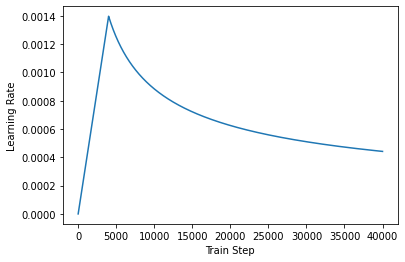

In [41]:
plt.plot(learning_rate(tf.range(40000, dtype=tf.float32)))
plt.ylabel('Learning Rate')
plt.xlabel('Train Step')

In [42]:
# Loss functions. Combined loss is a function that combines the normally used codon loss
# to accuracy of amino acids. My hypothesis is that it helps the model to converge
# faster due to the benefit of explicit reward from avoiding the introduction of mutations
# to the prediction. It should be noted that aa_accuracy is not a differentiable function
# so actually the benefits could be seen with aa_loss which I am working on

def masked_loss(label, pred):
  # Custom loss function
  mask = label != 0
  loss_object = tf.keras.losses.SparseCategoricalCrossentropy(
    from_logits=True, reduction='none')
  loss = loss_object(label, pred)

  mask = tf.cast(mask, dtype=loss.dtype)
  loss *= mask

  loss = tf.reduce_sum(loss)/tf.reduce_sum(mask)
  return loss


def masked_accuracy(label, pred):
  #Custom metrics
  pred = tf.argmax(pred, axis=2)
  label = tf.cast(label, pred.dtype)
  match = label == pred

  mask = label != 0

  match = match & mask

  match = tf.cast(match, dtype=tf.float32)
  mask = tf.cast(mask, dtype=tf.float32)
  return tf.reduce_sum(match)/tf.reduce_sum(mask)


def masked_aa_accuracy(label, pred):
  # Metric for validating aa accuracy
  pred = tf.argmax(pred, axis=2)
  pred = tensor_codon_to_tensor_aa.lookup(pred)
  label = tf.cast(label, pred.dtype)
  label = tensor_codon_to_tensor_aa.lookup(label)
  match = label == pred

  mask = label != 0

  match = match & mask

  match = tf.cast(match, dtype=tf.float32)
  mask = tf.cast(mask, dtype=tf.float32)
  return tf.reduce_sum(match)/tf.reduce_sum(mask)

def combined_loss(label, pred):
  # Optional loss function that forces aa fidelity. Could speed up convergence.
  loss = masked_loss(label, pred)
  aa_loss = 1.0 - masked_aa_accuracy(label, pred)
  weight = 1.5
  if loss < 1.5:
    weight = 0.5
  if loss < 1.0:
    weight = 0.0
  return loss + (aa_loss * weight)




In [43]:
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss',
                                            patience=3,
                                            restore_best_weights=True,
                                            verbose=1
                                            )



In [44]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

import tensorflow as tf
import datetime

# Clear any logs from previous runs
!rm -rf ./logs/



In [45]:
%tensorboard --logdir logs/fit

<IPython.core.display.Javascript object>

In [ ]:
# For training more than 1 model, add count
count = 1
accuracies = []
for i in transformers:
  train_batches = make_batches(tds)
  val_batches = make_batches(vds)

  log_dir = f"logs/fit/transformer_{count}" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
  tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

  learning_rate = CustomSchedule(d_model)

  optimizer = tf.keras.optimizers.experimental.Adam(learning_rate, beta_1=0.9, beta_2=0.9,
                                     epsilon=1e-9)
  i.compile(loss=masked_loss,
            optimizer=optimizer,
            metrics=[masked_accuracy, masked_aa_accuracy],)
  
  i.fit(train_batches,
                  epochs=100,
                  validation_data=val_batches,
                  callbacks=[callback, tensorboard_callback]
                  )
  count = count + 1
  

# Saving the model and Inference

In [ ]:
class Translator(tf.Module):
  def __init__(self, aa2id, codon2id, transformer):
    self.aa2id = aa2id
    self.codon2id = codon2id
    self.transformer = transformer

  def __call__(self, sentence, max_length=max_length):
    # adding the `[START]` and `[END]` tokens.
    sentence = self.aa2id(sentence)[tf.newaxis]

    encoder_input = sentence

    start_end = self.codon2id("<start> <end>")
    start = start_end[0][tf.newaxis]
    end = start_end[1][tf.newaxis]

    # `tf.TensorArray` is required here (instead of a Python list), so that the
    # dynamic-loop can be traced by `tf.function`.
    output_array = tf.TensorArray(dtype=tf.int64, size=0, dynamic_size=True)
    output_array = output_array.write(0, start)

    for i in tf.range(max_length):
      output = tf.transpose(output_array.stack())
      predictions = self.transformer([encoder_input, output], training=False)

      # Select the last token from the `seq_len` dimension.
      predictions = predictions[:, -1:, :]  # Shape `(batch_size, 1, vocab_size)`.

      predicted_id = tf.argmax(predictions, axis=-1)

      # Concatenate the `predicted_id` to the output which is given to the
      # decoder as its input.
      output_array = output_array.write(i+1, predicted_id[0])

      if predicted_id == end:
        print(end)
        break

    output = tf.transpose(output_array.stack())
    # The output shape is `(1, tokens)`.
    text = output[0]  # Shape: `()`.

    tokens = output[0]

    # `tf.function` prevents us from using the attention_weights that were
    # calculated on the last iteration of the loop.
    # So, recalculate them outside the loop.
    self.transformer([encoder_input, output[:,:-1]], training=False)
    attention_weights = self.transformer.decoder.last_attn_scores

    return text, attention_weights, tokens 

In [ ]:
# Can train multiple trained models at a time for ensembling
translators = []
for i in transformers:
  translators.append(Translator(aa2id, codon2id, i))

In [ ]:
class ExportTranslator(tf.Module):
  def __init__(self, translator):
    self.translator = translator

  @tf.function(input_signature=[tf.TensorSpec(shape=[], dtype=tf.string)])
  def __call__(self, sentence):
    (result,
     tokens,
     attention_weights) = self.translator(sentence, max_length=max_length)

    return result, attention_weights, tokens

In [ ]:
count = 1
for i in translators:
  translator = ExportTranslator(i)
  from datetime import datetime

  current_date = datetime.now().date()
  current_date = current_date.strftime("%d-%m-%Y")
  # insert your save path, for example in google drive
  save_path = f"transformer_100_{count}"
  print(f"Saving to:  {save_path}")
  tf.saved_model.save(translator, save_path)
  print("Save Ready!")
  print("Testataan lataus")
  reloaded = tf.saved_model.load(save_path)
  print("Kohde ladattu:" , reloaded)
  count = count + 1

In [ ]:
models = []
count = 1
for i in range(1):
  save_path = f"transformer_100_{count}"
  reloaded = tf.saved_model.load(save_path)
  models.append(reloaded)
  count = count + 1

In [ ]:
# Saving ´TensorBoard training metrics 

save_name = "test"
!tensorboard dev upload --logdir ./logs \
  --name f"{save_name}" \
  --description f"saving to: {save_name}" \
  --one_shot

In [ ]:
print("Valmis! Heippa!")

In [ ]:
!kill -9 -1